### **Imports and functions defintions**

In [1]:
from jupyterthemes import jtplot
from termcolor import colored
jtplot.reset()

In [2]:
from numpy import (
    ndarray, max
)
from cv2 import (
    imread, imshow, waitKey, destroyAllWindows, 
    cvtColor, COLOR_BGR2GRAY, calcHist, GaussianBlur
)
from matplotlib.pyplot import (
    plot, title, xlabel, ylabel, show,
    subplot, axis, tight_layout, subplots
)

In [3]:
def display_histogram(img : ndarray, return_hist=False) -> None: 
    
    histogram = calcHist([img], [0], None, [256], [0, 256])

    if return_hist: return histogram
    
    _, axs = subplots(1, 2, figsize=(10, 5))

    # Display the image in the first subplot
    if max(img) > 0:
        axs[0].imshow(img / max(img), cmap='gray', vmin=0, vmax=1)
    else:
        axs[0].imshow(img, cmap='gray', vmin=0, vmax=1)
    axs[0].set_title('Image')
    axs[0].axis('off')

    # Display the histogram in the second subplot
    axs[1].plot(histogram)
    axs[1].set_title('Image Histogram')
    axs[1].set_xlabel('Pixel Value')
    axs[1].set_ylabel('Frequency')

    tight_layout()

In [4]:
from cv2 import (
    threshold, THRESH_BINARY, THRESH_OTSU, findContours, 
    RETR_EXTERNAL, CHAIN_APPROX_SIMPLE, drawContours, FILLED, bitwise_and
)

from numpy import zeros_like

# obsolete
def segmentation_threshold(img : ndarray, cut_off : int = 0 ) -> ndarray:

    # _, thresh = threshold(img, 0, 255, THRESH_BINARY + THRESH_OTSU)
    _, thresh = threshold(img, cut_off, 255, THRESH_BINARY)
    
    # Find contours
    contours, _ = findContours(thresh, RETR_EXTERNAL, CHAIN_APPROX_SIMPLE)

    # Create a mask for the segmented objects
    segmented_mask = zeros_like(img)
    
    # Draw contours on the mask
    drawContours(segmented_mask, contours, -1, (255), thickness=FILLED)
    
    # Bitwise AND operation to extract segmented objects
    segmented_image = bitwise_and(img, img, mask=segmented_mask)

    return segmented_image

In [5]:
import numpy as np
from scipy.signal import find_peaks
import cv2
import matplotlib.pyplot as plt

def find_peaks_in_hist(img, hist, threshold, disp_hist=True):

    # for i, val in enumerate(hist): 
    #     if val != 0: print(i, val)
            
    # Flatten the histogram for peak finding
    hist_flat = hist.flatten()
    
    # Find peaks in the histogram
    peaks, _ = find_peaks(hist_flat, height=threshold)  # You can set an appropriate threshold

    if disp_hist:
        # Display the original image
        plt.subplot(2, 1, 1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')
        plt.axis('off')
        
        # Display the histogram
        plt.subplot(2, 1, 2)
        plt.plot(hist_flat, color='black')
        plt.plot(peaks, hist_flat[peaks], 'x', color='red', markeredgewidth=2, markersize=8)
        plt.title('Histogram with Peaks')

    return peaks

In [6]:
def display_peaks(img, peaks):

    # Display subplots for each peak
    for i, peak in enumerate(peaks):
        plt.figure()
        plt.imshow((img == peak).astype(np.uint8), cmap='gray')
        plt.title(f'Peak {i + 1}')

In [7]:
example_image_path = "..\\..\\foto\\image_20_0x_00175_22_6.png"

def read_image(path=example_image_path):
    img = imread(path)
    img = cvtColor(img, COLOR_BGR2GRAY)
    return img

img = read_image()

### **Histograms**

### Original photo

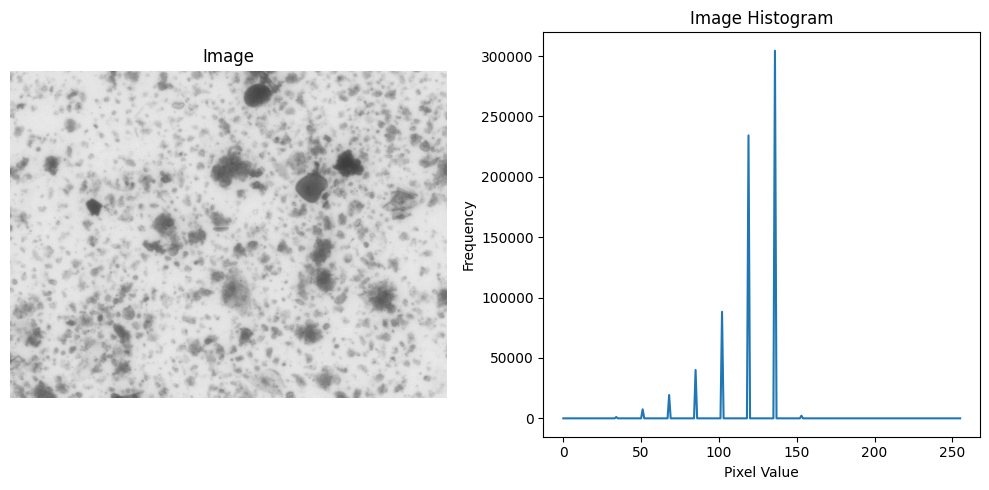

In [8]:
img = read_image()
display_histogram(img)
show()

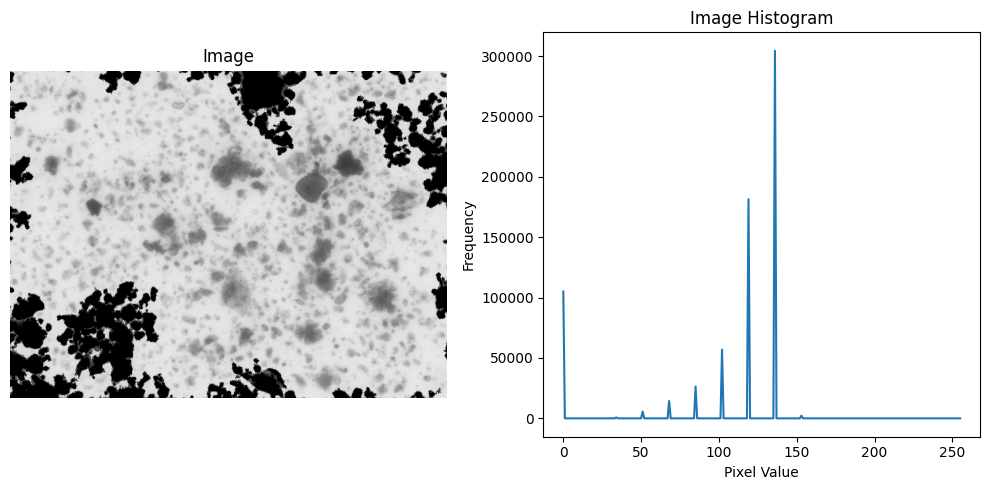

In [9]:
img = read_image()
img = segmentation_threshold(img, cut_off=130)
display_histogram(img)
show()

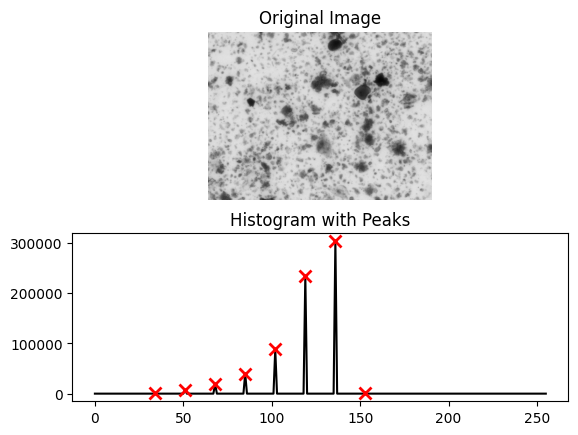

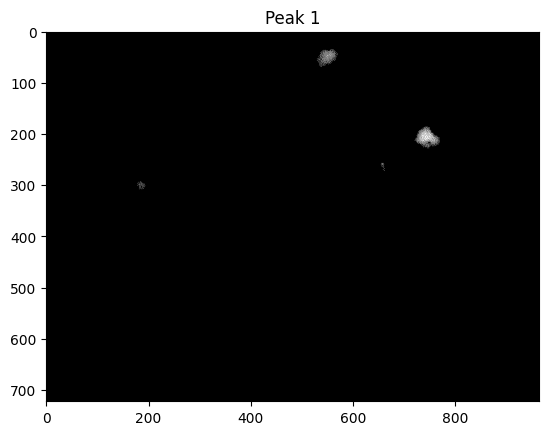

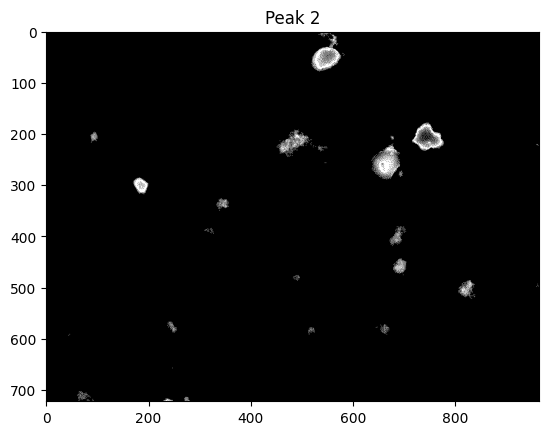

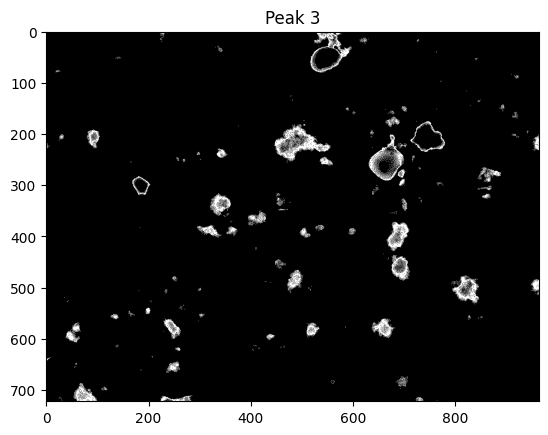

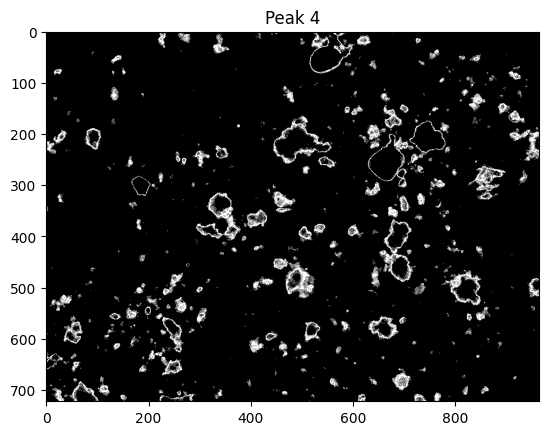

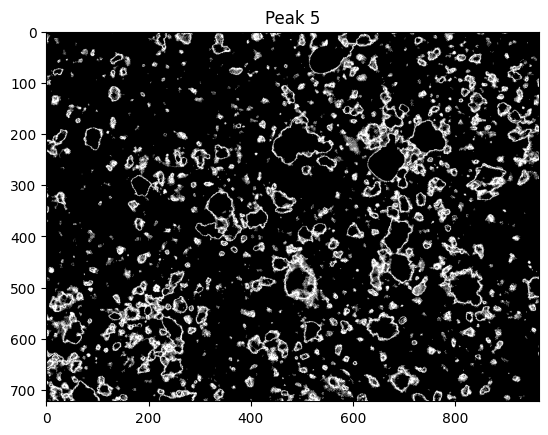

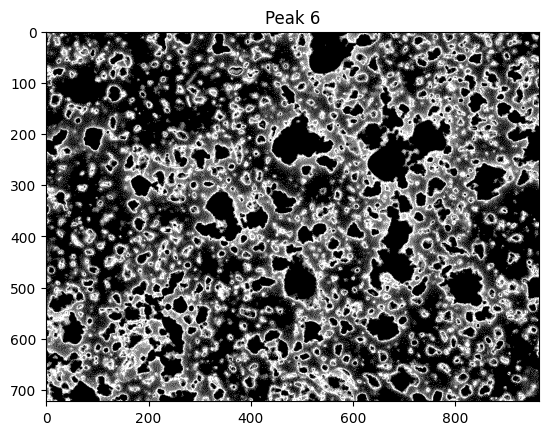

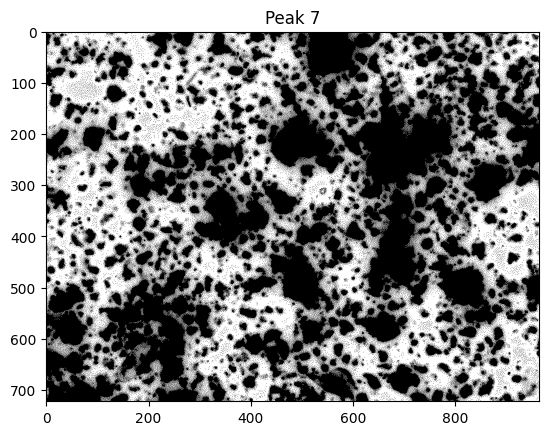

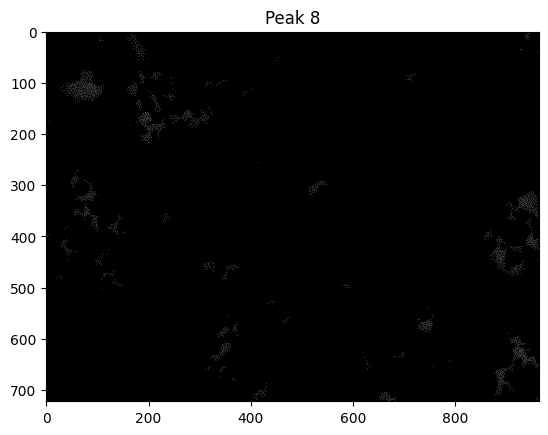

In [10]:
img = read_image()
hist = display_histogram(img, return_hist=True)
peaks = find_peaks_in_hist(img=img, hist=hist, threshold=0)
display_peaks(img=img, peaks=peaks)
show()

[ 34  51  68  85 102 119 136 153]


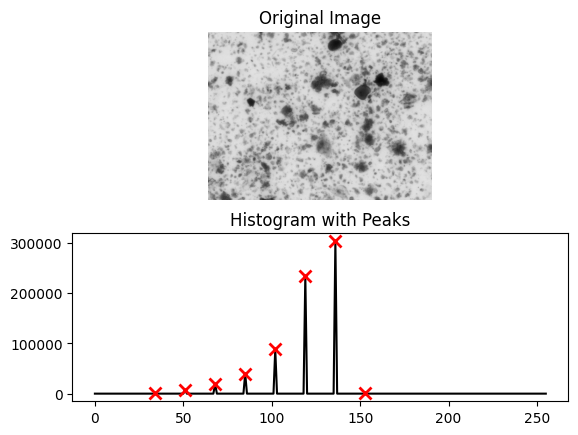

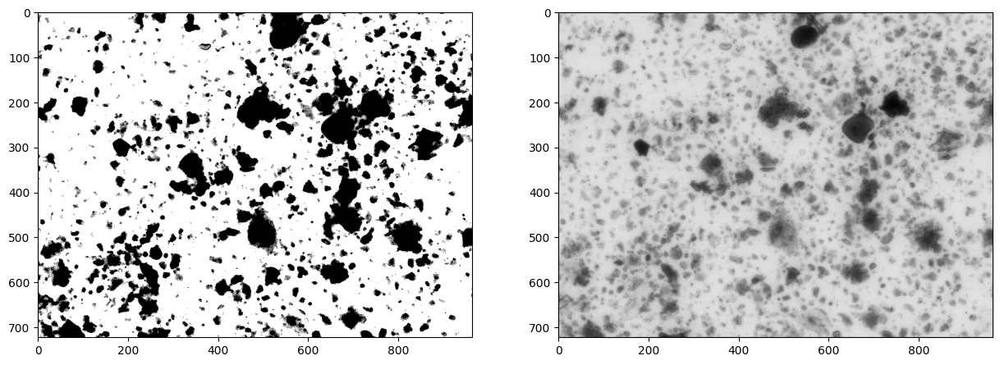

In [11]:
img = read_image()
hist = display_histogram(img, return_hist=True)
peaks = find_peaks_in_hist(img=img, hist=hist, threshold=0)
print(colored(peaks, 'white'))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow((img >= peaks[5]).astype(np.uint8), cmap='gray')
plt.subplot(1,2,2)
plt.imshow((img).astype(np.uint8), cmap='gray')

show()

### Blur photo

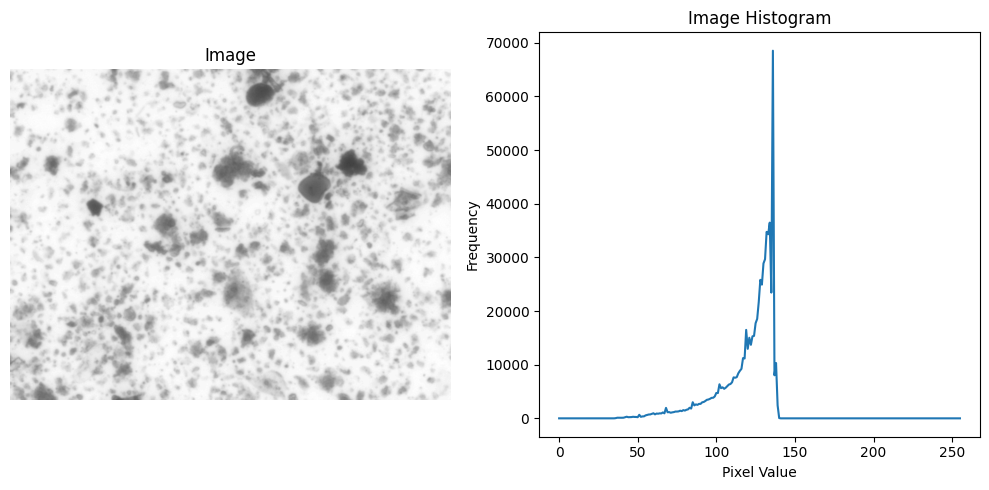

In [12]:
img = read_image()
img = GaussianBlur(img, (5, 5), 0)
display_histogram(img)
show()

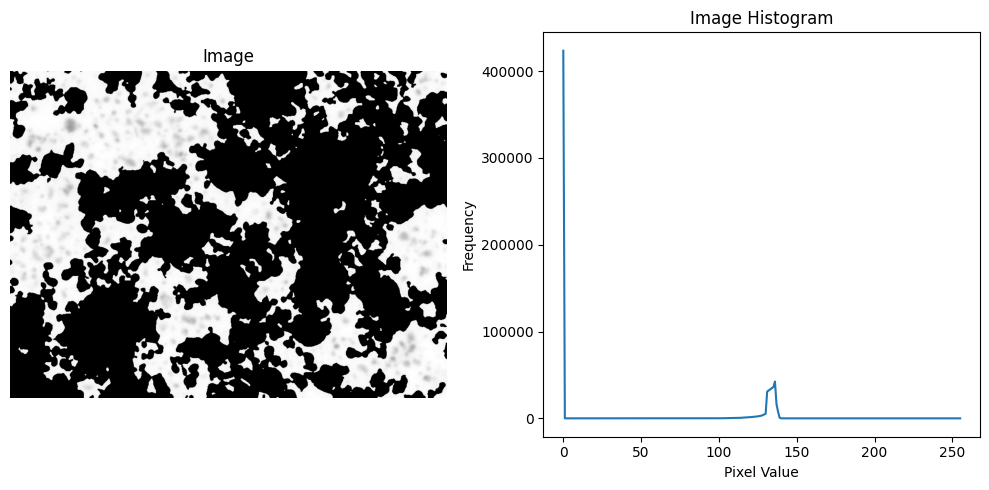

In [13]:
img = read_image()
img = GaussianBlur(img, (11, 11), 0)
img = segmentation_threshold(img, cut_off=130)
display_histogram(img)
show()

C:\Users\pc\AppData\Local\Temp\ipykernel_10024\2809535118.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


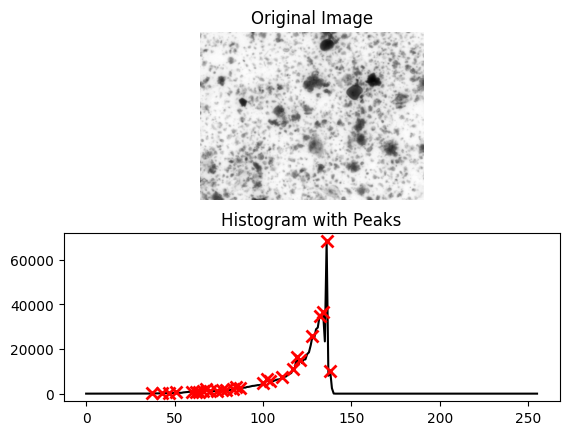

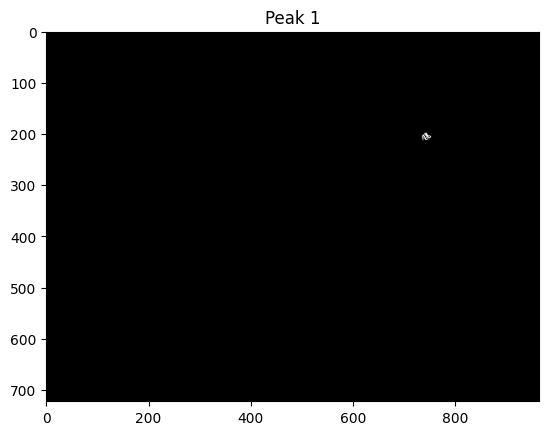

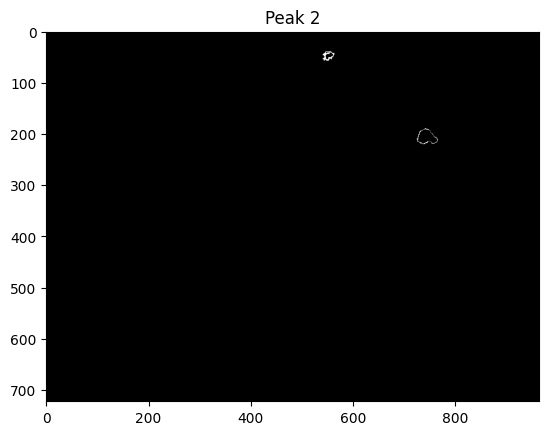

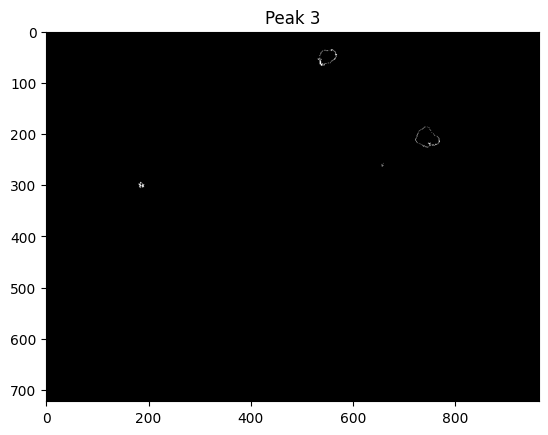

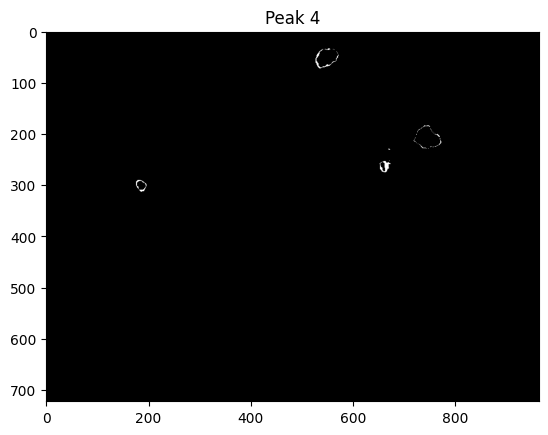

...

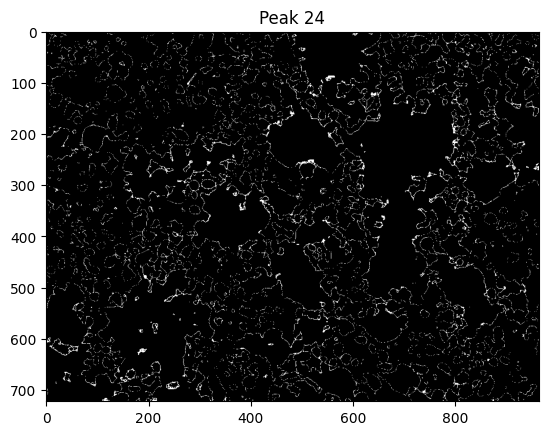

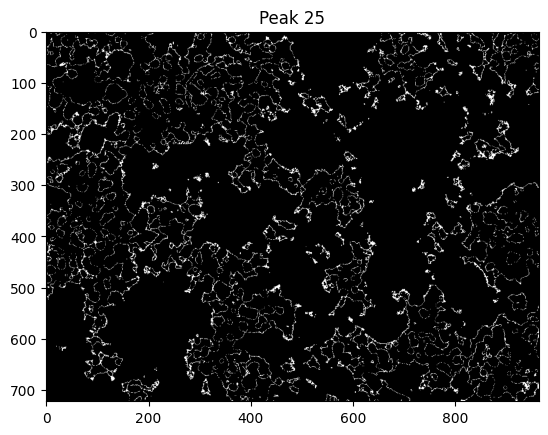

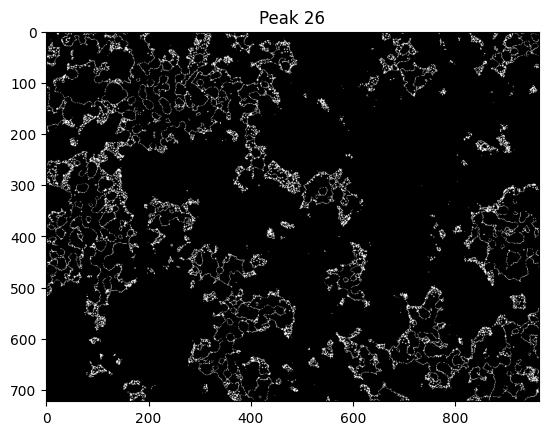

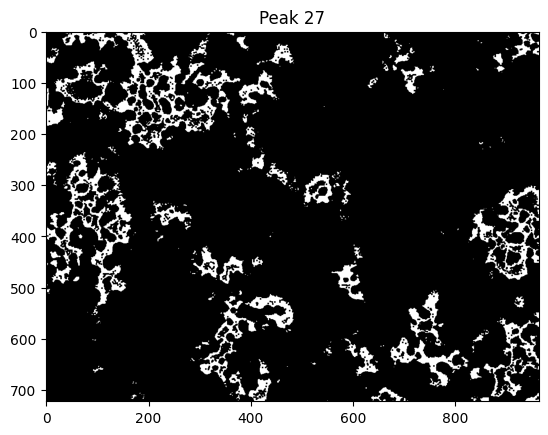

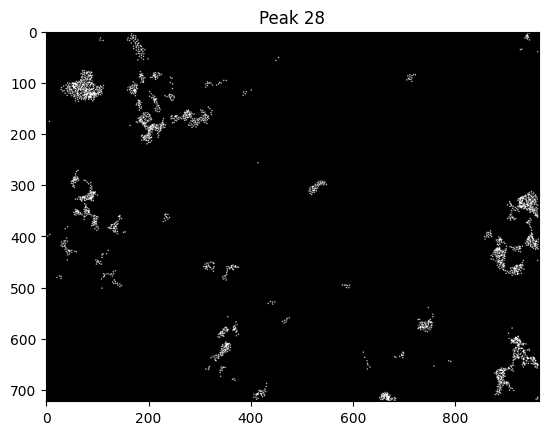

In [14]:
img = read_image()
img = GaussianBlur(img, (5, 5), 0)
hist = display_histogram(img, return_hist=True)
peaks = find_peaks_in_hist(img=img, hist=hist, threshold=0)
display_peaks(img=img, peaks=peaks)
show()

[ 37  43  47  51  60  62  64  66  68  70  74  77  79  83  85  87 100 102
 104 111 117 119 121 128 132 134 136 138]
28


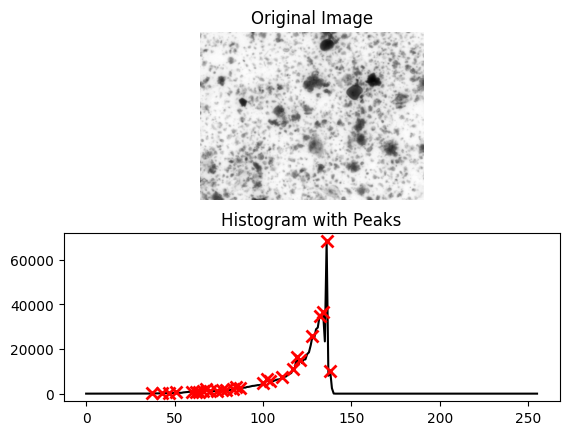

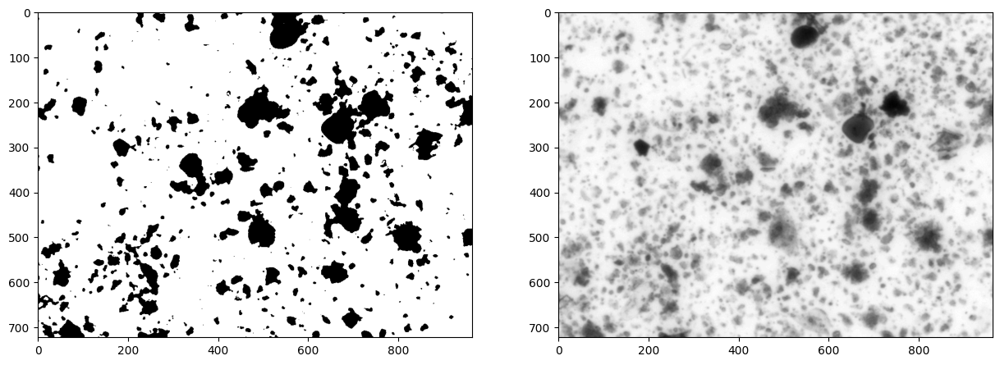

In [15]:
img = read_image()
img = GaussianBlur(img, (5, 5), 0)
hist = display_histogram(img, return_hist=True)
peaks = find_peaks_in_hist(img=img, hist=hist, threshold=0)
print(colored(peaks, 'white'))
print(colored(len(peaks), 'white'))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow((img >= peaks[18]).astype(np.uint8), cmap='gray')
plt.subplot(1,2,2)
plt.imshow((img).astype(np.uint8), cmap='gray')

show()

sprawdzić erozję i zwiększenie ostrości, przeiterować przez wszystkie opcje wycięcia tła i sprawdzić kiedy jest najwięcej obiektów. Sprawdź inne metody(chatGPT)

# **Segmentation**

### **Thresholding**

In [16]:
from cv2 import CHAIN_APPROX_NONE

def find_second_largest_and_return_corresponding(lst1, lst2):
    # Combine the two lists into pairs (value, index)
    pairs = list(zip(lst1, lst2))
    
    # Sort the pairs based on the values in the first list
    pairs.sort(key=lambda x: x[0])
    
    # Get the second largest value from the sorted first list
    second_largest_value = pairs[-2][0]
    
    # Find the corresponding value in the second list
    corresponding_value = [pair[1] for pair in pairs if pair[0] == second_largest_value][0]
    
    return corresponding_value

def segmentation_thresholding(img, disp=True, kernel=(5,5), iter=1):

    # img = cv2.dilate(img.copy(), kernel, iter)
    hist = display_histogram(img, return_hist=True)
    peaks = find_peaks_in_hist(img=img, hist=hist, threshold=0, disp_hist=False)
    # print(colored(peaks.tolist(), 'white'))

    ####################################################################################################################

    kernel = np.ones(kernel, np.uint8)  # You can adjust the kernel size as needed
    max_num_labels = ([],[])
    
    for i, peak in enumerate(peaks.tolist()):
        print('im here: ', i)
        img_seg = img.copy() >= peak
    
        img_seg = img_seg.astype(np.uint8) * 255
        img_seg = (img_seg.copy() == 0).astype(np.uint8) * 255
        # img_seg_dil = (img_seg_dil.copy() == 0).astype(np.uint8) * 255
        
        # Perform erosion
        # img_seg = cv2.erode(img_seg, kernel, iter)
        
        img_seg_dil = cv2.erode(img_seg.copy(), kernel, iter)
        img_seg_dil = cv2.dilate(img_seg_dil.copy(), kernel, iter)
    
        # contours, _ = findContours(img_seg.copy(), RETR_EXTERNAL, CHAIN_APPROX_NONE)
        ### get each particle
    
        # num_labels, _, _, centroids = cv2.connectedComponentsWithStats(img_seg, connectivity, cv2.CV_32S)
        # print(colored(num_labels, 'white'))
    
        connectivity=4
        num_labels, _, _, centroids = cv2.connectedComponentsWithStats(img_seg_dil, connectivity, cv2.CV_32S)
        print(colored(num_labels, 'white'))
            
        max_num_labels[0].append(num_labels)
        max_num_labels[1].append(i)

    #######################

    best_solution_idx = find_second_largest_and_return_corresponding(max_num_labels[0], max_num_labels[1])
    print(colored(best_solution_idx,'white'))
    img_seg = img.copy() >= peaks[best_solution_idx]

    img_seg = img_seg.astype(np.uint8) * 255

    img_seg = (img_seg.copy() == 0).astype(np.uint8) * 255
    # img_seg_dil = (img_seg_dil.copy() == 0).astype(np.uint8) * 255
    
    # Perform erosion
    # img_seg = cv2.erode(img_seg, kernel, iter)
    
    img_seg_dil = cv2.erode(img_seg.copy(), kernel, iter)
    img_seg_dil = cv2.dilate(img_seg_dil.copy(), kernel, iter)

    # contours, _ = findContours(img_seg.copy(), RETR_EXTERNAL, CHAIN_APPROX_NONE)
    ### get each particle

    # num_labels, _, _, centroids = cv2.connectedComponentsWithStats(img_seg, connectivity, cv2.CV_32S)
    # print(colored(num_labels, 'white'))

    connectivity=4
    num_labels, _, _, centroids = cv2.connectedComponentsWithStats(img_seg_dil, connectivity, cv2.CV_32S)
    print(colored(num_labels, 'white'))




    ####################################################################################################################

    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    
    img_seg_dil_no_dots = img_seg_dil.copy()
    img_no_dots = img.copy()
    
    img_seg = cv2.cvtColor(img_seg, cv2.COLOR_GRAY2RGB)
    
    # Mark centroids on the original image
    for i in range(1, num_labels):  # Start from 1 to exclude background component (label 0)
        centroid = (int(centroids[i, 0]), int(centroids[i, 1]))
        cv2.circle(img_seg, (centroid[0],centroid[1]), 5, (0, 255, 0), -1)  # Mark centroid with a green circle

    img_seg_dil = cv2.cvtColor(img_seg_dil, cv2.COLOR_GRAY2RGB)
    
    # Mark centroids on the original image
    for i in range(1, num_labels):  # Start from 1 to exclude background component (label 0)
        centroid = (int(centroids[i, 0]), int(centroids[i, 1]))
        cv2.circle(img_seg_dil, (centroid[0],centroid[1]), 5, (0, 255, 0), -1)  # Mark centroid with a green circle
        cv2.circle(img, (centroid[0],centroid[1]), 5, (0, 255, 0), -1)  # Mark centroid with a green circle

    ### display
    if disp:
        plt.figure(figsize=(15,15))
        plt.subplot(2,2,1)
        plt.imshow((img_no_dots).astype(np.uint8), cmap='gray')
        plt.title('threshold')
        plt.subplot(2,2,2)
        plt.imshow((img).astype(np.uint8), cmap='gray')
        plt.title('original')
        plt.subplot(2,2,3)
        plt.imshow((img_seg_dil_no_dots).astype(np.uint8), cmap='gray')
        plt.title('threshold + dilate')
        plt.subplot(2,2,4)
        plt.imshow((img_seg_dil).astype(np.uint8), cmap='gray')
        plt.title('threshold + dilate')
    
    return img_seg_dil

im here:  0
1
im here:  1
5
im here:  2
45
im here:  3
83
im here:  4
303
im here:  5
682
im here:  6
747
im here:  7
2
5
682


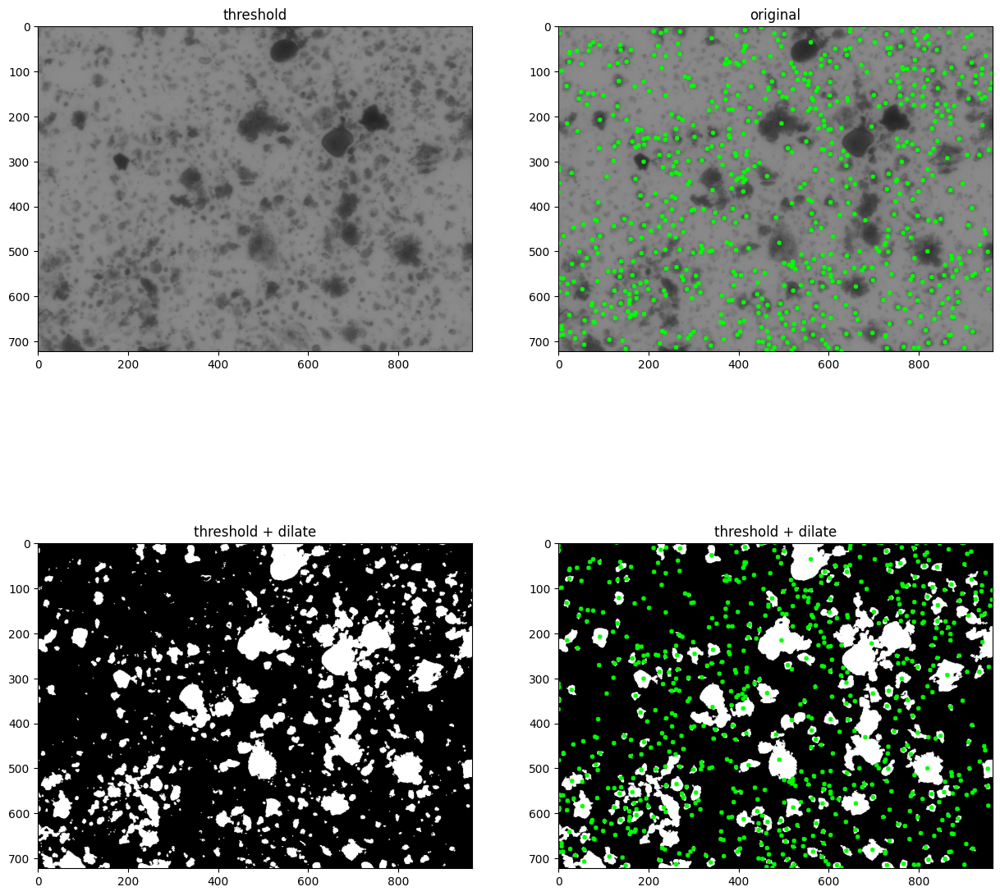

In [17]:
img = read_image()

kernel_size = 2
segmentation_thresholding(img=img, disp=True, kernel=(kernel_size, kernel_size), iter=1)

show()

im here:  0
6
im here:  1
5
im here:  2
5
im here:  3
12
im here:  4
9
im here:  5
23
im here:  6
46
im here:  7
60
im here:  8
81
im here:  9
77
im here:  10
90
im here:  11
103
im here:  12
116
im here:  13
149
im here:  14
186
im here:  15
201
im here:  16
226
im here:  17
259
im here:  18
193
16
226


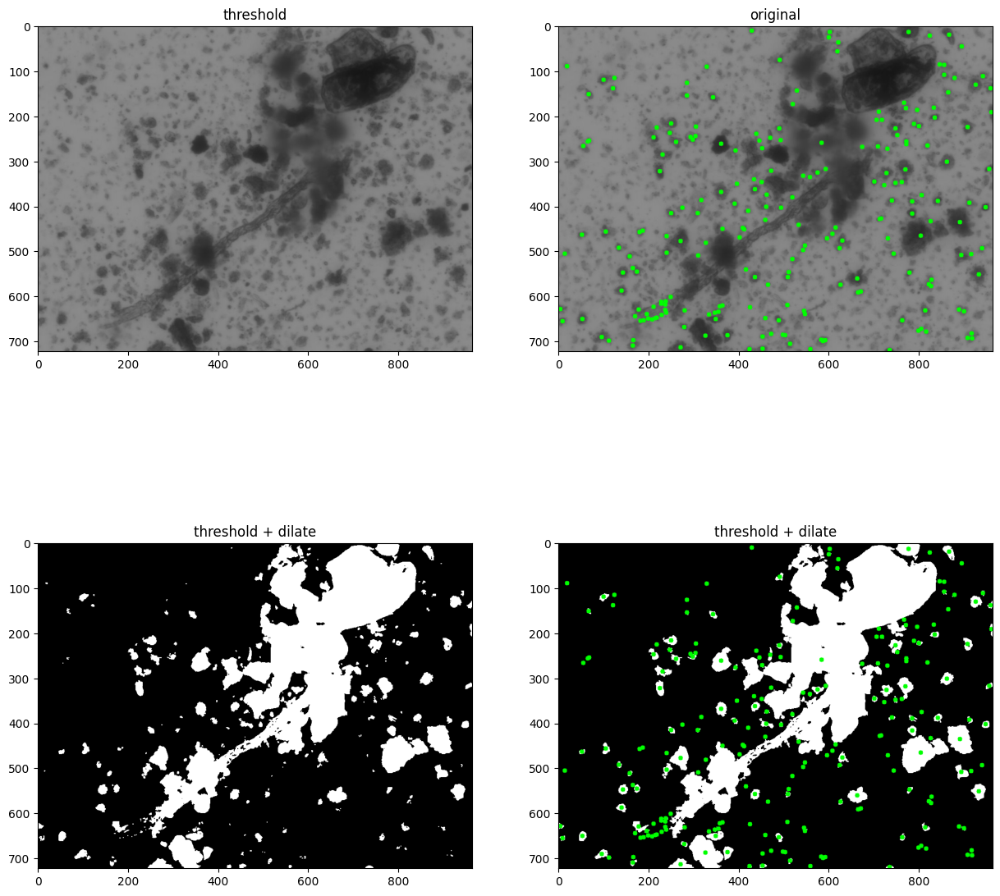

In [18]:
img = read_image(path="..\\..\\foto\\y4mGYzT4Ef8GWDPnZqNPFNL_-YZsSu20PdUVUdrF7ddcQpNcVGvlXo4jwb8oN0BY76ybA1Ywjbdd3guYWkeaDr-IjCBnnTZ72ZjgDhAEUq4306ZGxbWoM8SJkVTXcU0pnVhYACKRezeo0_8K2oybl4omw76Xy33rxZk91ZShrc6EbnYBSfOqlcNfjZq1D7LNpV50Si-BfwCP5tY60YrC9uATA.jpg")

kernel_size = 2
segmentation_thresholding(img=img, disp=True, kernel=(kernel_size, kernel_size), iter=1)

show()

# **PyTorch.vision**

C:\Users\pc\AppData\Local\pypoetry\Cache\virtualenvs\inzynierka-l99V3c70-py3.10\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\pc\AppData\Local\pypoetry\Cache\virtualenvs\inzynierka-l99V3c70-py3.10\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


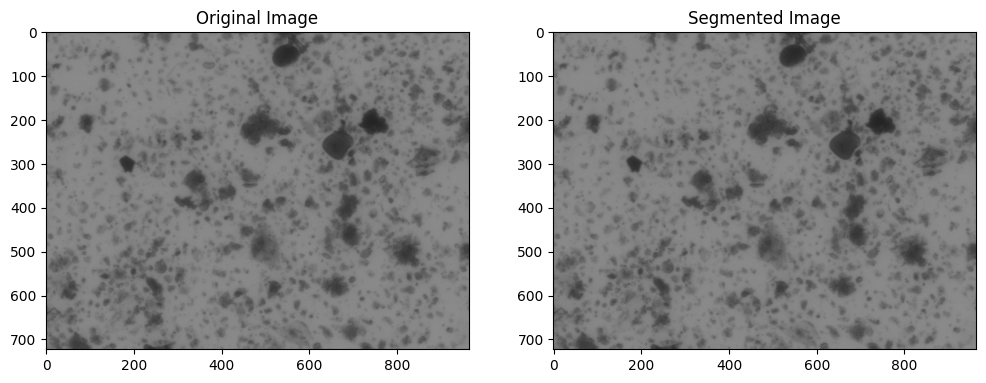

In [19]:
import torch
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the pre-trained U-Net model
model = models.segmentation.deeplabv3_resnet50(pretrained=True).eval()

img = read_image()
img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

# Preprocess the image
transform = transforms.Compose([transforms.ToPILImage(), transforms.ToTensor()])
input_tensor = transform(img).unsqueeze(0)

# Make predictions
with torch.no_grad():
    output = model(input_tensor)['out'][0]

# Convert the output to a probability map and then to a binary mask
probability_map = torch.nn.functional.softmax(output, dim=0)[1]
binary_mask = probability_map > 0.5

# Convert the binary mask to a numpy array
binary_mask_np = binary_mask.cpu().numpy()

# Overlay the binary mask on the original image
segmented_image = np.array(img)
segmented_image[binary_mask_np] = [255, 0, 0]  # Set the segmented region to red

# Display the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(np.array(img))
axes[0].set_title('Original Image')

axes[1].imshow(segmented_image)
axes[1].set_title('Segmented Image')

plt.show()


# **Tensorflow**

import tensorflow as tf
import tensorflow_estimator
from tensorflow_estimator.python.estimator.canned.dnn import dnn_logit_fn_builder
import tensorflow_hub as hub
import cv2
import numpy as np

# Load the DeepLab model from TensorFlow Hub
model_url = "https://tfhub.dev/tensorflow/tfjs-model/deeplabv3/mobilenet_v2/classification/4"
model = hub.load(model_url)

# Load and preprocess the image
image = read_image()
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
input_tensor = tf.image.convert_image_dtype(image, dtype=tf.uint8)[tf.newaxis, ...]

# Make predictions
result = model(input_tensor)['segmentation_mask']
result = tf.image.resize(result, image.shape[:2])

# Post-process the segmentation mask
threshold = 0.5
segmentation_mask = result > threshold
segmentation_mask = np.squeeze(segmentation_mask)

# Apply the mask to the original image
segmented_image = image * segmentation_mask[..., tf.newaxis]

# Display the results
cv2.imshow('Original Image', cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
cv2.imshow('Segmented Image', cv2.cvtColor(segmented_image.astype(np.uint8), cv2.COLOR_RGB2BGR))
cv2.waitKey(0)
cv2.destroyAllWindows()


some problems with tf-hub

# **Segment Anything Model**

In [20]:
import torch
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

MODEL_TYPE = "default"
sam = sam_model_registry[MODEL_TYPE](checkpoint="..\models\SAM\sam_vit_h_4b8939.pth")
sam.to(device=DEVICE)
mask_generator = SamAutomaticMaskGenerator(sam)

In [21]:
img = read_image()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
masks = mask_generator.generate(img)

In [22]:
print(colored(len(masks), 'white'))
print(colored(masks[2], 'white'))

221
{'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 3471, 'bbox': [630, 202, 70, 89], 'predicted_iou': 0.9900120496749878, 'point_coords': [[677.8125, 214.640625]], 'stability_score': 0.9839908480644226, 'crop_box': [0, 0, 964, 723]}


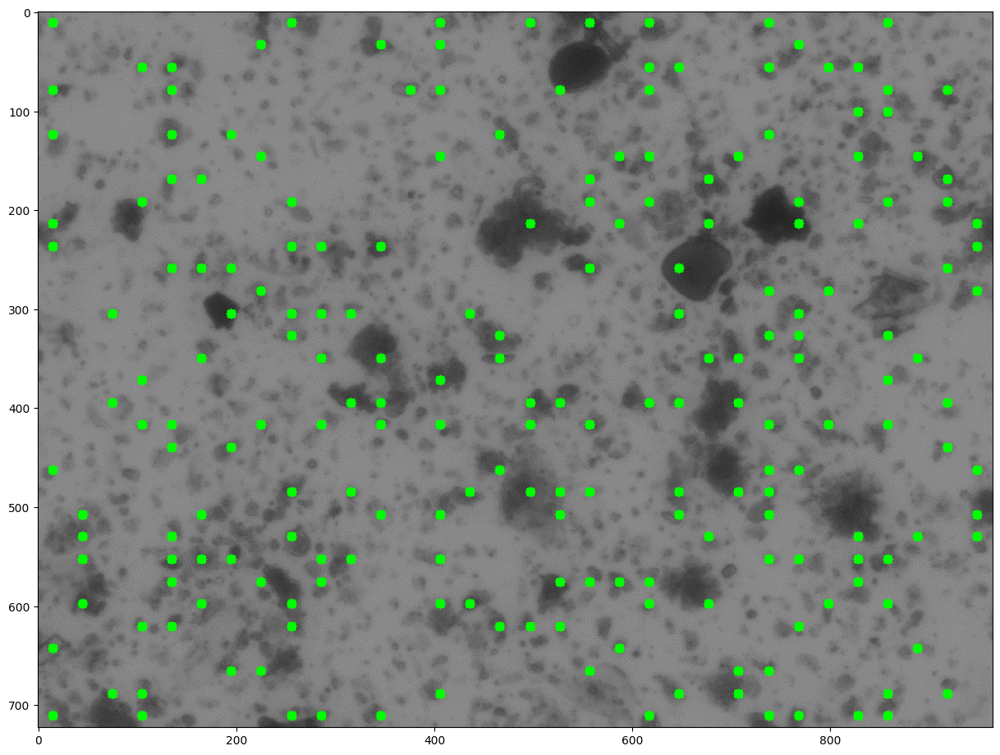

In [23]:
for mask in masks:  
    centroid = mask['point_coords'][0]
    # print(colored(centroid, 'white'))
    cv2.circle(img, (int(centroid[0]),int(centroid[1])), 5, (0, 255, 0), -1)  # Mark centroid with a green circle

plt.figure(figsize=(15,15))
plt.imshow((img).astype(np.uint8), cmap='gray')

In [24]:
img = read_image(path="..\\..\\foto\\y4mGYzT4Ef8GWDPnZqNPFNL_-YZsSu20PdUVUdrF7ddcQpNcVGvlXo4jwb8oN0BY76ybA1Ywjbdd3guYWkeaDr-IjCBnnTZ72ZjgDhAEUq4306ZGxbWoM8SJkVTXcU0pnVhYACKRezeo0_8K2oybl4omw76Xy33rxZk91ZShrc6EbnYBSfOqlcNfjZq1D7LNpV50Si-BfwCP5tY60YrC9uATA.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
masks = mask_generator.generate(img)

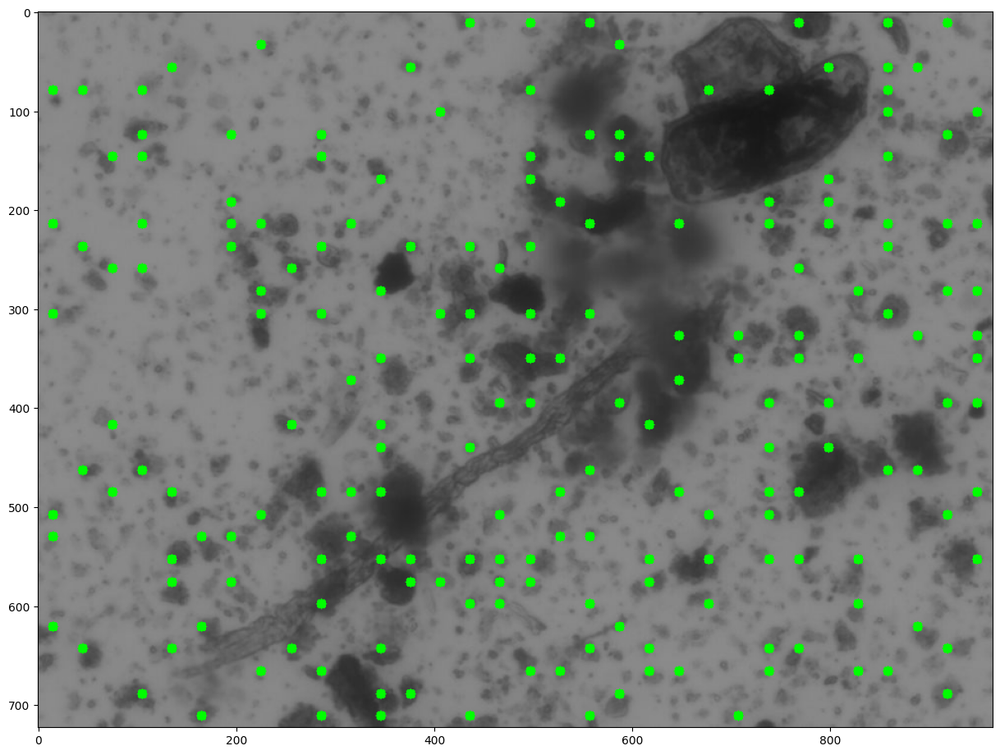

In [25]:
for mask in masks:  
    centroid = mask['point_coords'][0]
    # print(colored(centroid, 'white'))
    cv2.circle(img, (int(centroid[0]),int(centroid[1])), 5, (0, 255, 0), -1)  # Mark centroid with a green circle

plt.figure(figsize=(15,15))
plt.imshow((img).astype(np.uint8), cmap='gray')

### **Using prompt input**

In [26]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
        
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2)) 

In [27]:
from segment_anything import SamPredictor, sam_model_registry

MODEL_TYPE = "default"
sam = sam_model_registry[MODEL_TYPE](checkpoint="..\models\SAM\sam_vit_h_4b8939.pth")
sam.to(device=DEVICE)
predictor = SamPredictor(sam)

### **Using rectangles**

In [28]:
img = read_image()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

predictor.set_image(img)

input_point = torch.tensor([
    [664, 255],
    [481, 213],
    [542, 55],
    [187, 301],
    [499, 486],
    [665, 581],
    [371, 79],
    [214, 66],
    [61, 174],
    [89, 402],
    [915, 442]
])

input_box = torch.tensor([
    [633, 234, 684, 289],
    [451, 185, 557, 239],
    [511, 38, 578, 72],
    [166, 286, 208, 316],
    [463, 434, 542, 531],
    [624, 556, 688, 603],
    [358, 70, 386, 85],
    [209, 61, 220, 69],
    [56, 168, 68, 178],
    [77, 385, 100, 409],
    [904, 433, 926, 452]
])

transformed_coords = predictor.transform.apply_coords_torch(input_point, img.shape[:2])
transformed_boxes = predictor.transform.apply_boxes_torch(input_box, img.shape[:2])

# print(transformed_coords.shape)
# print(input_label.shape)
# print(transformed_boxes.shape)

input_label = torch.ones(transformed_coords.shape[0])
# print(input_label)
masks, scores, logits = predictor.predict_torch(
    point_coords=None,
    point_labels=input_label,
    boxes=transformed_boxes,
    multimask_output=False
)

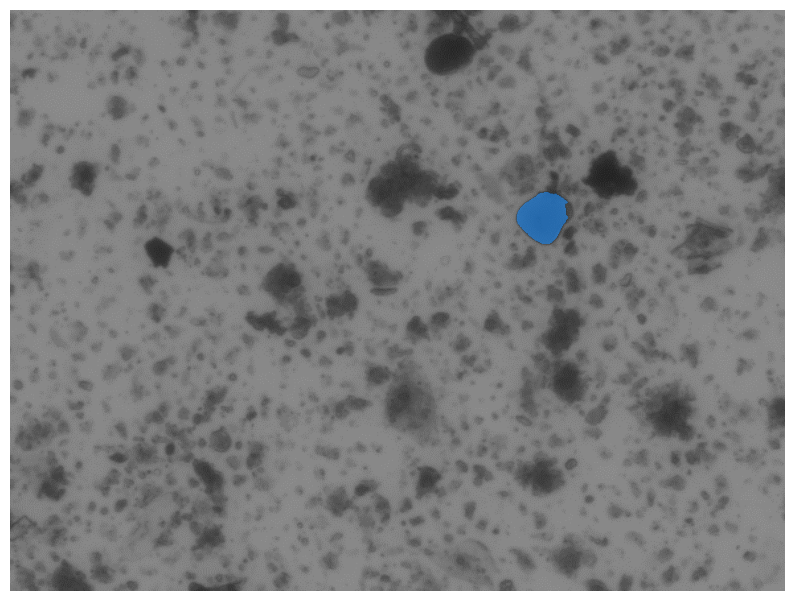

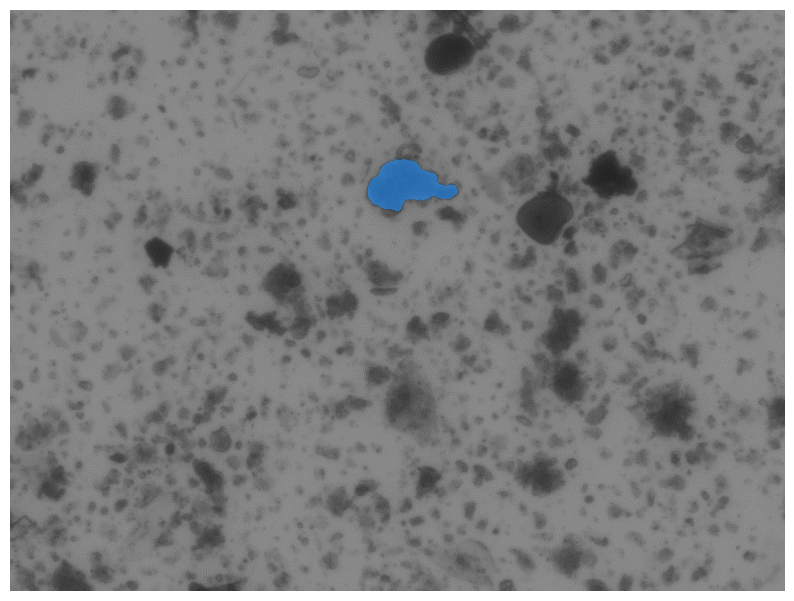

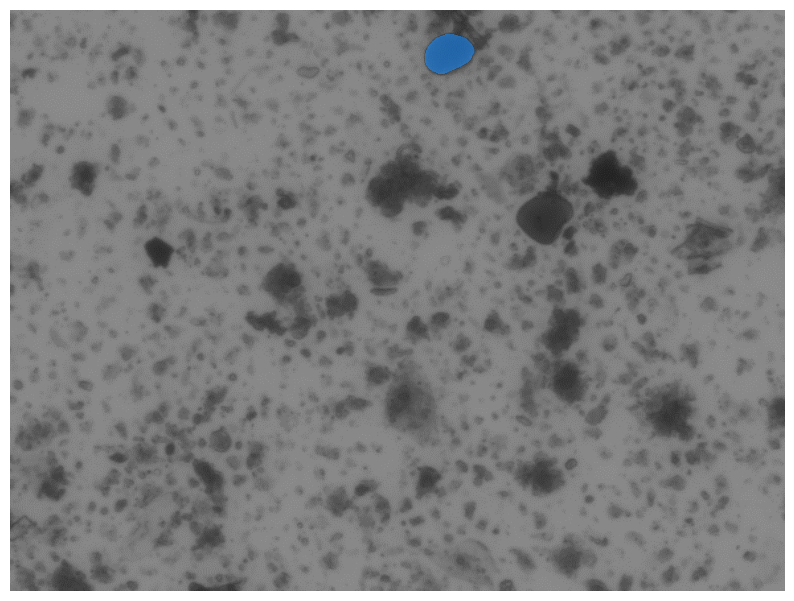

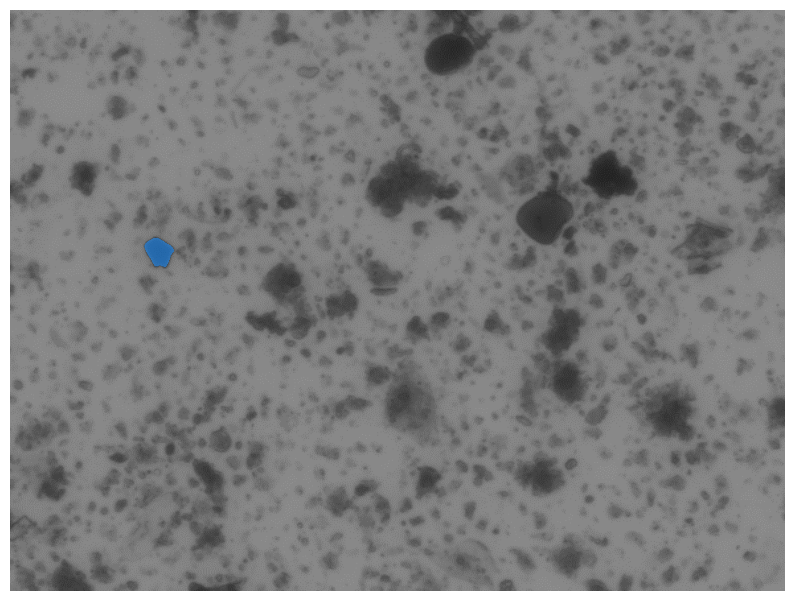

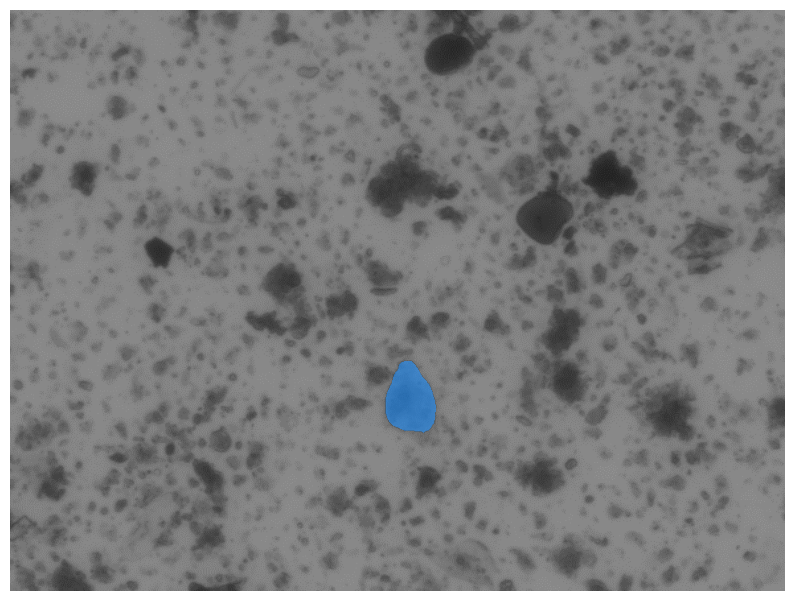

...

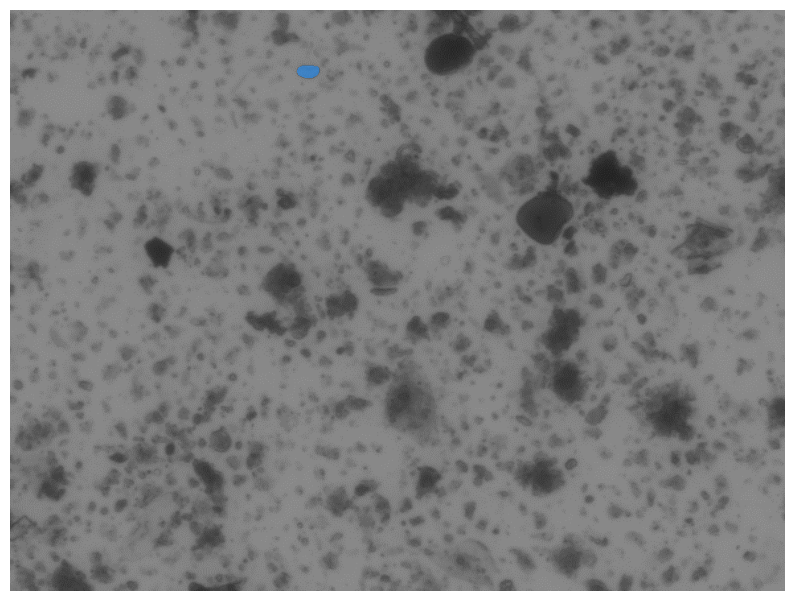

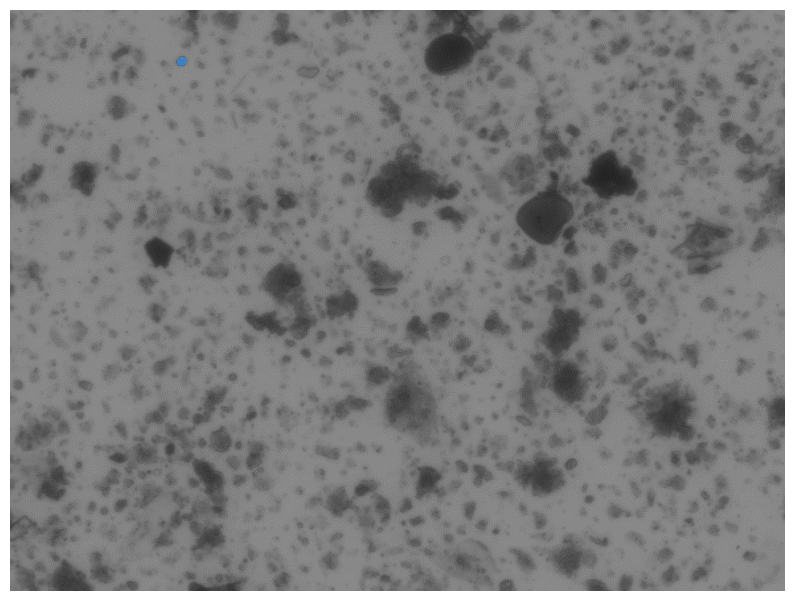

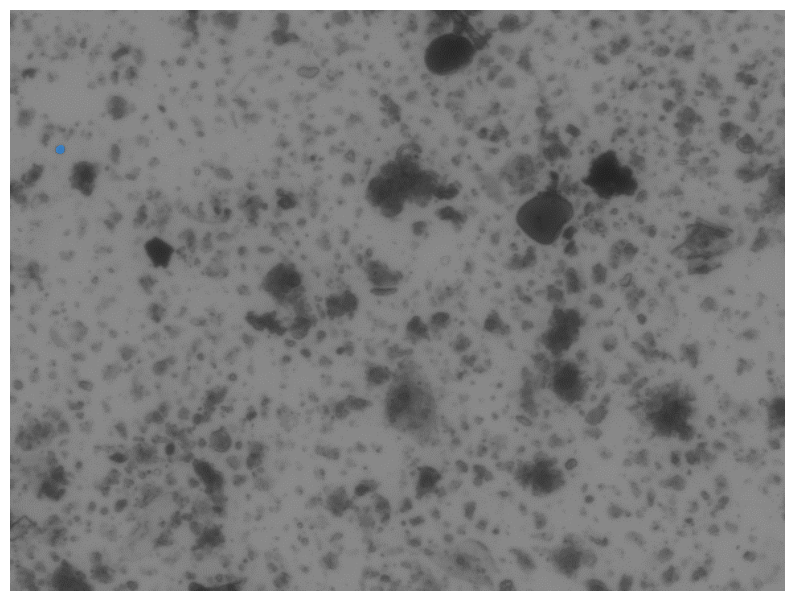

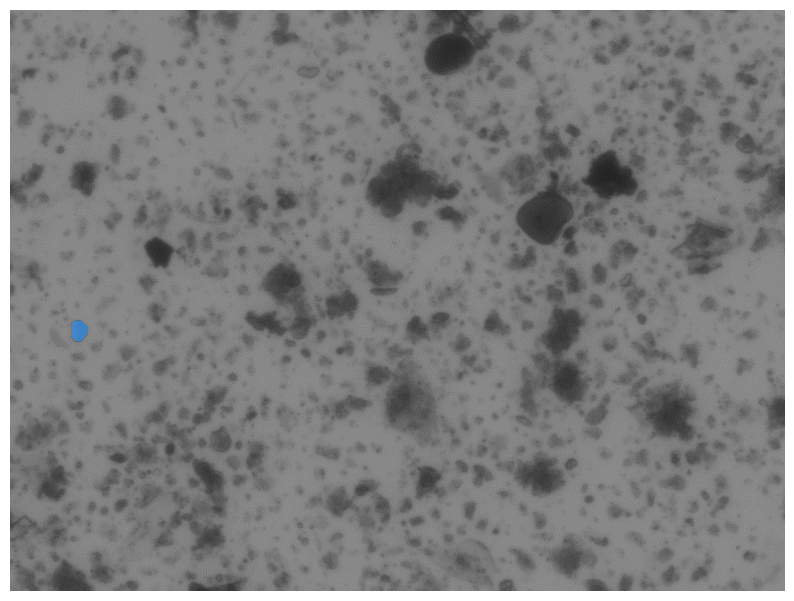

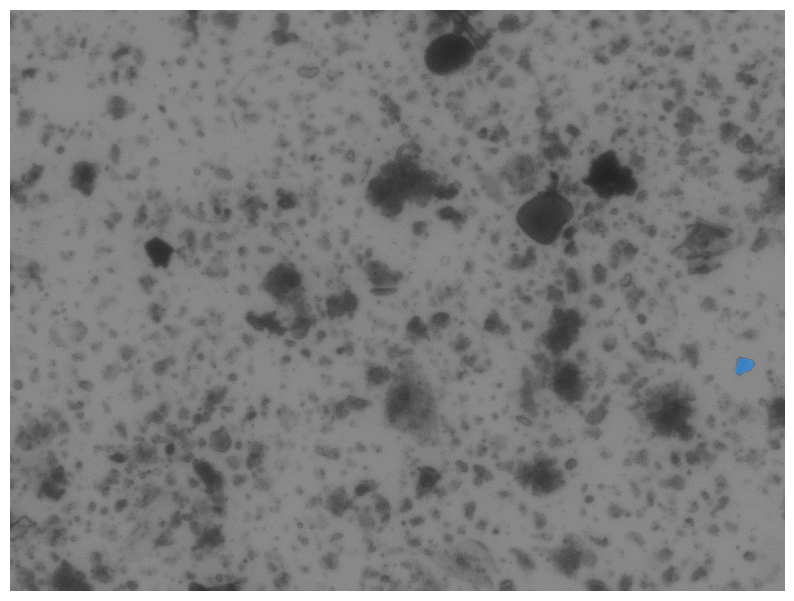

In [29]:
# img = read_image()
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# print(img.shape)
for i, (mask, score) in enumerate(zip(masks, scores)):  
    # print(colored('im here','white'))
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(mask, plt.gca())
    # show_points(input_point, input_label, plt.gca())
    # plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

### **Using coords**

In [30]:
img = read_image()
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

predictor.set_image(img)

foreground_point = np.array([
    [664, 255],
    [481, 213],
    [542, 55],
    [187, 301],
    [499, 486],
    [665, 581],
    [371, 79],
    [214, 66],
    [61, 174],
    [89, 402],
    [915, 442]
])

background_point = np.array([
    [145, 334],
    [273, 165],
    [940, 328],
    [713, 86],
    [542, 289],
    [503, 254],
    [661, 701],
    [452, 525],
    [146, 338],
    [320, 463]
])

input_point = np.concatenate((foreground_point, background_point), axis=0)

foreground_label = np.ones(foreground_point.shape[0])
background_label = np.zeros(background_point.shape[0])
input_label = np.concatenate((foreground_label, background_label), axis=0)

# print(logits[2].shape)

masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    # mask_input=logits[2],
    multimask_output=True
)

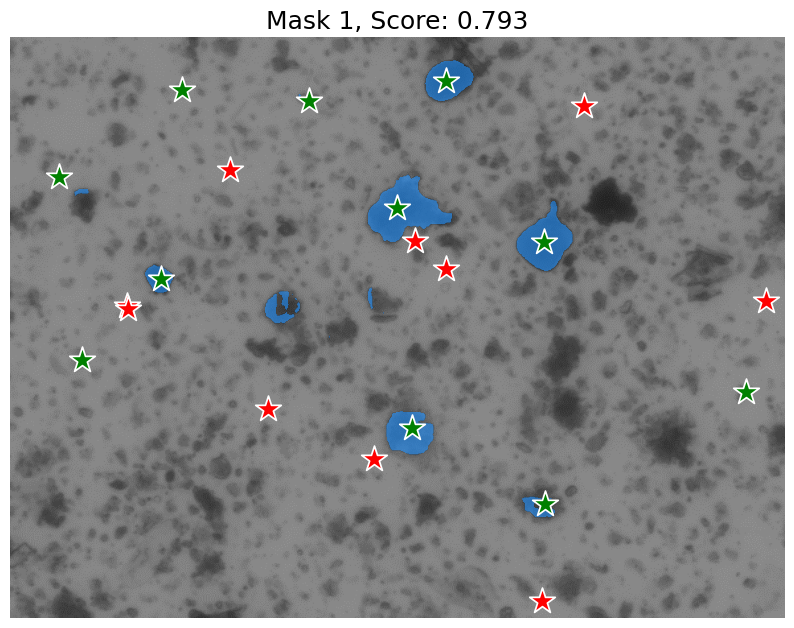

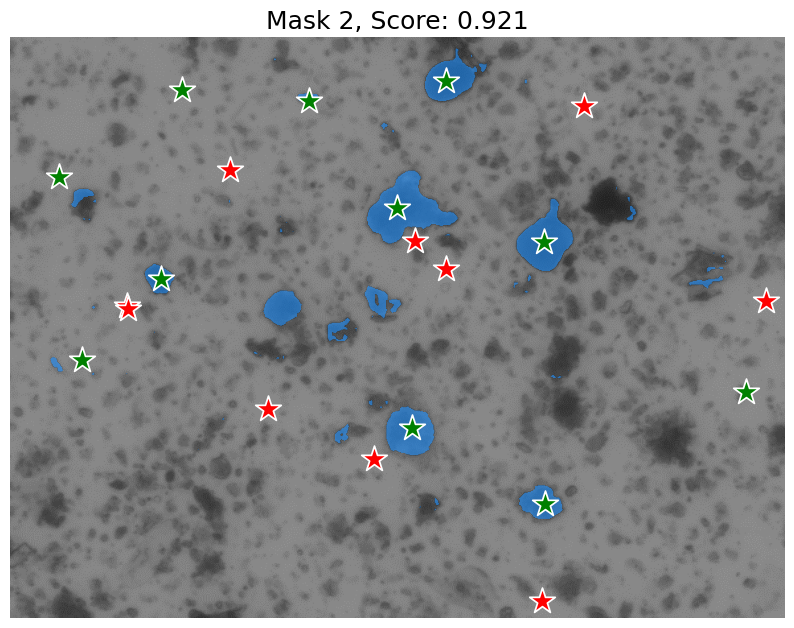

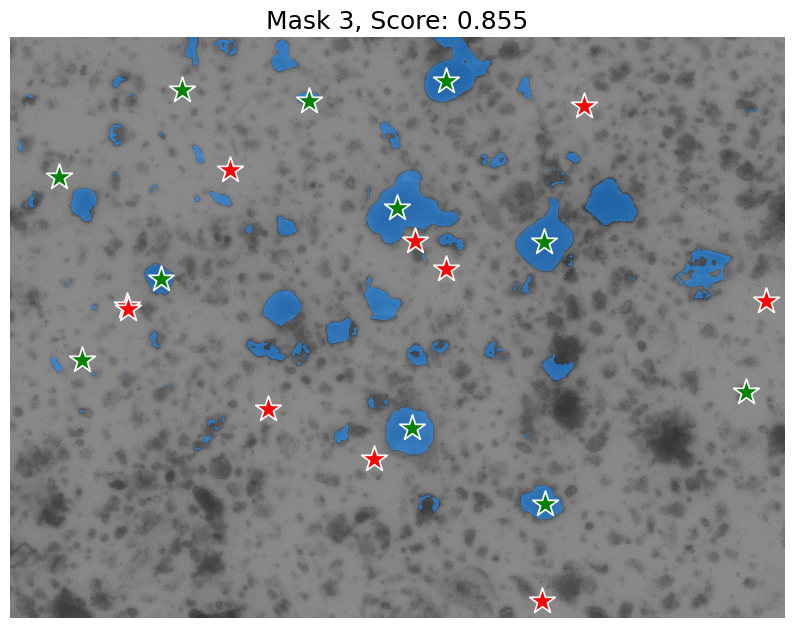

In [31]:
# img = read_image()
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# print(img.shape)
for i, (mask, score) in enumerate(zip(masks, scores)):  
    # print(colored('im here','white'))
    plt.figure(figsize=(10,10))
    
    plt.imshow(img)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

In [32]:
import cv2

# Function to handle mouse events
def mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        print(colored(f"[{x}, {y}],", 'white'))

# Read the image
image = read_image()

# Check if the image is loaded successfully
if image is None:
    print("Error: Unable to load image.")
else:
    # Create a window and set the callback function for mouse events
    cv2.namedWindow('Image')
    cv2.setMouseCallback('Image', mouse_click)

    while True:
        # Display the image
        cv2.imshow('Image', image)

        # Break the loop if 'Esc' key is pressed
        if cv2.waitKey(1) == 27:
            break

    # Destroy the window and close the program
    cv2.destroyAllWindows()


[23, 340],


In [33]:
import cv2

# Global variables to store coordinates
start_point = None
end_point = None
click_count = 0

# Function to handle mouse events
def mouse_click(event, x, y, flags, param):
    global start_point, end_point, click_count

    if event == cv2.EVENT_LBUTTONDOWN:
        if click_count % 3 == 0:
            # First click, print coordinates
            print(colored(f"[{x}, {y}],", 'white'))
        elif click_count % 3 == 1:
            start_point = (x, y)
        else:
            # Third click, print rectangle coordinates
            end_point = (x, y)
            print(colored(f"[{start_point[0]}, {start_point[1]}, {end_point[0]}, {end_point[1]}],", 'white'))

        click_count += 1


# Read the image
image = read_image()

# Check if the image is loaded successfully
if image is None:
    print("Error: Unable to load image.")
else:
    # Create a window and set the callback function for mouse events
    cv2.namedWindow('Image')
    cv2.setMouseCallback('Image', mouse_click)

    while True:
        # Display the image
        cv2.imshow('Image', image)

        # Break the loop if 'Esc' key is pressed
        if cv2.waitKey(1) == 27:
            break

    # Destroy the window and close the program
    cv2.destroyAllWindows()


# **Simple cutting off the backgorund**

In [34]:
import cv2

# Function to handle mouse events
def mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # Print coordinates
        print(colored(f"Clicked at pixel coordinates (x, y): ({x}, {y})", 'white'))

        # Get color information of the clicked pixel
        color = image[y, x]
        print(colored(f"Color at pixel coordinates (x, y): ({x}, {y}) - BGR: {color}", 'white'))

# Read the image
image = read_image()
# image = read_image(path="..\\..\\foto\\y4mGYzT4Ef8GWDPnZqNPFNL_-YZsSu20PdUVUdrF7ddcQpNcVGvlXo4jwb8oN0BY76ybA1Ywjbdd3guYWkeaDr-IjCBnnTZ72ZjgDhAEUq4306ZGxbWoM8SJkVTXcU0pnVhYACKRezeo0_8K2oybl4omw76Xy33rxZk91ZShrc6EbnYBSfOqlcNfjZq1D7LNpV50Si-BfwCP5tY60YrC9uATA.jpg")

# Check if the image is loaded successfully
if image is None:
    print("Error: Unable to load image.")
else:
    # Create a window and set the callback function for mouse events
    cv2.namedWindow('Image')
    cv2.setMouseCallback('Image', mouse_click)

    while True:
        # Display the image
        cv2.imshow('Image', image)

        # Break the loop if 'Esc' key is pressed
        if cv2.waitKey(1) == 27:
            break

    # Destroy the window and close the program
    cv2.destroyAllWindows()


- <b>decrease variety of intensity 
- <b>find highest peak on histogram
- <b>segment background
- <b> remove adjacent colors
- <b>binarize result
- <b>dilation -> erosion -> dilation
- <b>stats -> centroids, area

In [35]:
import cv2
import numpy as np

def decrease_variety_of_intensity (image: np.ndarray, num_clusters: int) -> np.ndarray:
    # Reshape the image to a 2D array of pixels
    pixels = image.reshape((-1, 3))

    # Convert to float32 for k-means clustering
    pixels = np.float32(pixels)

    # Define criteria and apply kmeans()
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixels, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert back to 8 bit values
    centers = np.uint8(centers)

    # Map the labels to the centers
    segmented_image = centers[labels.flatten()]

    # Reshape back to the original image shape
    segmented_image = segmented_image.reshape(image.shape)

    return segmented_image

# Read the image
image = read_image()

# Specify the number of clusters (desired intensity levels)
num_clusters = 3

# Perform color quantization
image = decrease_variety_of_intensity(image, num_clusters)
image_original = read_image()

# Display the original and quantized images
cv2.imshow('Quantized Image', image)
cv2.imshow('Image', image_original)
# cv2.imshow('Quantized Image', output_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


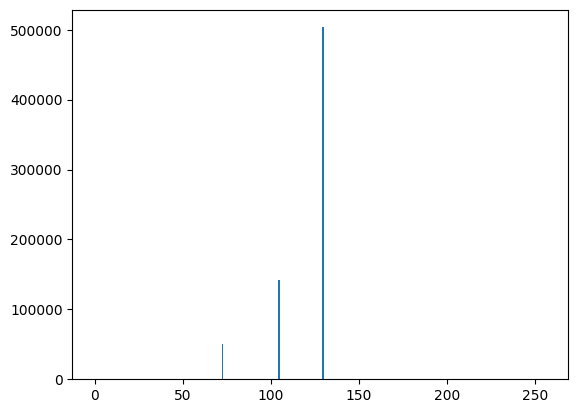

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_highest_peak_on_histogram(image: np.ndarray):
    # Convert the image to grayscale
    # gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the histogram
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])

    # Find the index of the maximum value (peak) in the histogram
    peak_index = np.argmax(hist)
    # print(colored(peak_index, 'white'))
    return peak_index

# Find the highest peak on the right side of the histogram
image = read_image()
num_clusters = 3
image = decrease_variety_of_intensity(image, num_clusters)
background_color = find_highest_peak_on_histogram(image)

# Display the result


# Display the histogram for visualization
# gray_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
plt.hist(image.ravel(), 256, [0, 256])
plt.show()


In [37]:
def segment_background(image: np.ndarray, background_color: int) -> np.ndarray: return image == background_color

image = read_image()
num_clusters = 2
image = decrease_variety_of_intensity(image, num_clusters)
background_color = find_highest_peak_on_histogram(image)
image = segment_background(image, background_color)
image_original = read_image()

cv2.imshow('Segmented Image', image.astype(np.uint8) * 255)
cv2.imshow('Image', image_original)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [53]:
# import cv2
import numpy as np

def process_image(gray_image):

    # Calculate the histogram
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    # Find the intensity values corresponding to the peaks
    highest_intensity = np.argmax(hist)
    hist[highest_intensity] = 0  # Set the peak value to 0 to find the second peak
    middle_intensity = np.argmax(hist)
    hist[middle_intensity] = 0  # Set the peak value to 0 to find the third peak
    lowest_intensity = np.argmax(hist)

    # Create masks for the clusters
    high_intensity_mask = (gray_image == highest_intensity)
    middle_intensity_mask = (gray_image == middle_intensity)
    lowest_intensity_mask = (gray_image == lowest_intensity)

    # # Label connected components in the middle intensity mask
    # _, middle_labels, _, _ = cv2.connectedComponentsWithStats(middle_intensity_mask.astype(np.uint8))

    # # Find the connected component labels touching the lowest intensity mask
    # touching_labels = np.unique(middle_labels[lowest_intensity_mask])

    # # Create the final result
    # result = np.zeros_like(image)
    # result[high_intensity_mask] = 0  # Black for high intensity
    # result[lowest_intensity_mask] = 255  # White for low intensity
    # result[middle_intensity_mask] = 255
    # # result[lowest_intensity_mask & touching_mask] = 0  # Black for touching middle and lowest components

    # # Set the touching components to black
    # for label in touching_labels:
    #     result[middle_labels == label] = 0



    # Create a kernel for morphological operations
    kernel = np.ones((3, 3), np.uint8)

    # Perform dilation to identify pixels adjacent to the middle color
    middle_adjacent_mask = cv2.dilate(middle_intensity_mask.astype(np.uint8), kernel)

    # Perform dilation to identify pixels adjacent to the lowest color
    lowest_adjacent_mask = cv2.dilate(lowest_intensity_mask.astype(np.uint8), kernel)

    # Create the final result
    result = np.zeros_like(gray_image)
    result[lowest_intensity_mask] = 255
    result[middle_adjacent_mask & ~lowest_adjacent_mask] = 255  # White for middle color adjacent to background
    result[~middle_adjacent_mask & lowest_adjacent_mask] = 0  # Black for middle color adjacent to lowest color





    

    
    return result

# Example usage:
# Read the image
image = read_image()
num_clusters = 3
image = decrease_variety_of_intensity(image, num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())

# Process the image
result_image = process_image(image)

# Display the original and processed images
cv2.imshow('Original Image', image)
cv2.imshow('Processed Image', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


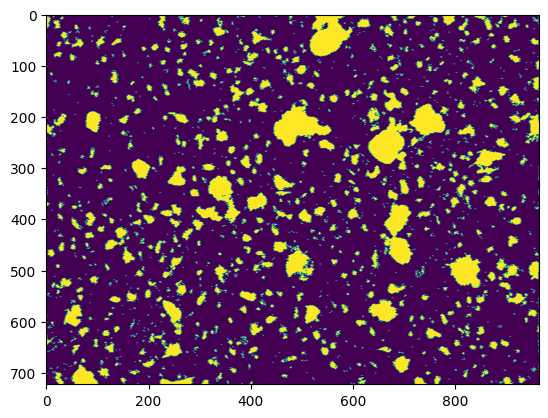

In [71]:
import cv2
import numpy as np

def remove_adjacent_colors(gray_image: np.ndarray):
    # Calculate the histogram
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    # Find the intensity values corresponding to the peaks
    highest_intensity = np.argmax(hist)
    hist[highest_intensity] = 0  # Set the peak value to 0 to find the second peak
    middle_intensity = np.argmax(hist)
    hist[middle_intensity] = 0  # Set the peak value to 0 to find the third peak
    lowest_intensity = np.argmax(hist)

    # Create masks for the clusters
    high_intensity_mask = (gray_image == highest_intensity)
    middle_intensity_mask = (gray_image == middle_intensity)
    lowest_intensity_mask = (gray_image == lowest_intensity)

    # Create the final result
    result = np.zeros_like(gray_image, dtype=np.uint8)
    result[high_intensity_mask] = 0
    result[middle_intensity_mask] = 255  # White for middle color
    result[lowest_intensity_mask] = 255  # Black for lowest color
    
    # Identify connected components for the middle intensity mask
    _, middle_labels = cv2.connectedComponents(middle_intensity_mask.astype(np.uint8))

    # Iterate through each connected component of middle intensity
    for label in range(1, middle_labels.max() + 1):
        # Create a mask for the current connected component
        current_component_mask = (middle_labels == label)

        # Dilate the mask to identify neighboring pixels
        dilated_mask = cv2.dilate(current_component_mask.astype(np.uint8), np.ones((3, 3), np.uint8))

        # Check if there are any pixels belonging to the lowest intensity cluster in the dilated mask
        if np.any(dilated_mask & lowest_intensity_mask):
            # If adjacent to the lowest intensity, set the pixels in the current component to black
            result[current_component_mask] = 0

    return result

# Example usage:
# Read the image
image = read_image()
num_clusters = 3
image = decrease_variety_of_intensity(image, num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())

# Process the image
result_image = remove_adjacent_colors(image.copy())

# Display the original and processed images
cv2.imshow('Original Image', image)
cv2.imshow('Processed Image', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

plt.imshow(result_image)
plt.show()

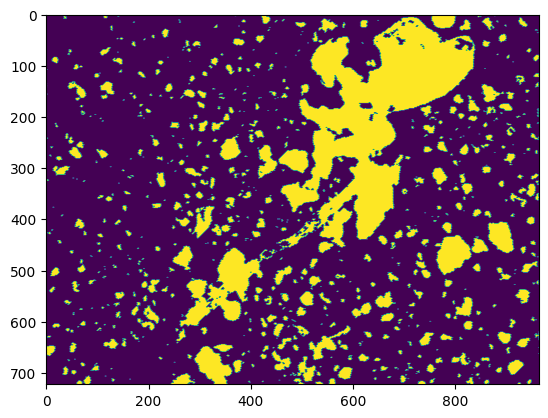

In [72]:
# Example usage:
# Read the image
image = read_image(path="..\\..\\foto\\y4mGYzT4Ef8GWDPnZqNPFNL_-YZsSu20PdUVUdrF7ddcQpNcVGvlXo4jwb8oN0BY76ybA1Ywjbdd3guYWkeaDr-IjCBnnTZ72ZjgDhAEUq4306ZGxbWoM8SJkVTXcU0pnVhYACKRezeo0_8K2oybl4omw76Xy33rxZk91ZShrc6EbnYBSfOqlcNfjZq1D7LNpV50Si-BfwCP5tY60YrC9uATA.jpg")
num_clusters = 3
image = decrease_variety_of_intensity(image, num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())

# Process the image
result_image = remove_adjacent_colors(image.copy())

# Display the original and processed images
cv2.imshow('Original Image', image)
cv2.imshow('Processed Image', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

plt.imshow(result_image)
plt.show()

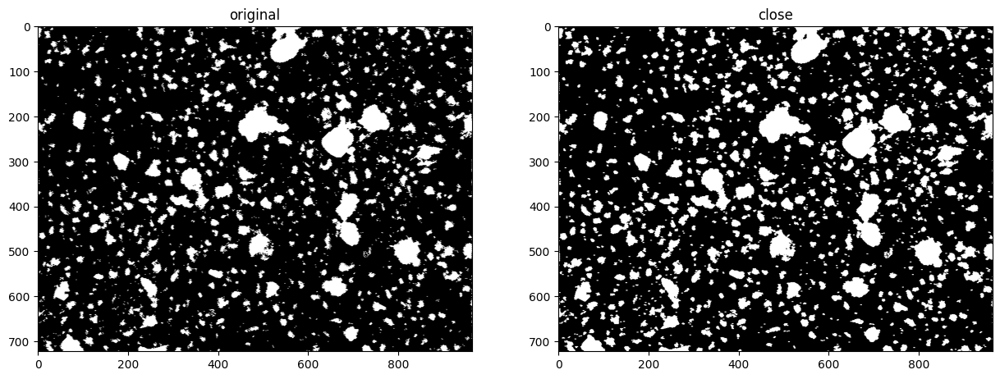

In [85]:
import cv2
import numpy as np

def closing_morphology(binary_image, kernel_size):

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    
    # Dilation to fill small gaps
    dilated_image = cv2.dilate(binary_image, kernel, iterations=1)

    # Erosion to remove small noise
    eroded_image = cv2.erode(dilated_image, kernel, iterations=1)

    # Dilation to restore original object size
    corrected_image = cv2.dilate(eroded_image, kernel, iterations=1)

    return corrected_image

image = read_image()
num_clusters = 3
image = decrease_variety_of_intensity(image.copy(), num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())
image = remove_adjacent_colors(image.copy())
corrected_image = closing_morphology(image.copy(), 2)

# Display the original and corrected images
# cv2.imshow('Original Binary Image', image)
# cv2.imshow('Corrected Binary Image', corrected_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow((image).astype(np.uint8), cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow((corrected_image).astype(np.uint8), cmap='gray')
plt.title('close')
plt.show()

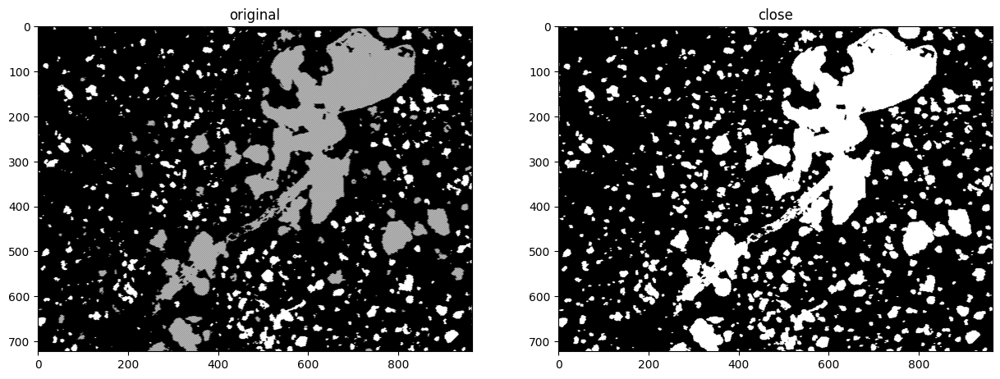

In [91]:
image = read_image(path="..\\..\\foto\\y4mGYzT4Ef8GWDPnZqNPFNL_-YZsSu20PdUVUdrF7ddcQpNcVGvlXo4jwb8oN0BY76ybA1Ywjbdd3guYWkeaDr-IjCBnnTZ72ZjgDhAEUq4306ZGxbWoM8SJkVTXcU0pnVhYACKRezeo0_8K2oybl4omw76Xy33rxZk91ZShrc6EbnYBSfOqlcNfjZq1D7LNpV50Si-BfwCP5tY60YrC9uATA.jpg")
num_clusters = 3
image = decrease_variety_of_intensity(image.copy(), num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())
image = remove_adjacent_colors(image.copy())
corrected_image = closing_morphology(image.copy(), 2)

# Display the original and corrected images
# cv2.imshow('Original Binary Image', image)
# cv2.imshow('Corrected Binary Image', corrected_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow((image).astype(np.uint8), cmap='gray')
plt.title('original')
plt.subplot(1,2,2)
plt.imshow((corrected_image).astype(np.uint8), cmap='gray')
plt.title('close')
plt.show()

In [98]:
import cv2
import numpy as np
import pandas as pd

def count_objects(binary_image):
    # Find connected components with statistics
    _, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_image)

    # Number of objects (excluding background)
    num_objects = len(stats) - 1  # Exclude background label

    # Object information (area, bounding box, and centroid)
    object_info = []

    for i in range(1, len(stats)):  # Exclude background label
        area = stats[i, cv2.CC_STAT_AREA]
        x, y, width, height, _ = stats[i]
        centroid = (int(centroids[i, 0]), int(centroids[i, 1]))

        # Bounding box coordinates
        top_left = (x, y)
        bottom_right = (x + width, y + height)

        object_info.append({
            'id': i,
            'area': area,
            'centroid': centroid,
            'rectangle': (top_left, bottom_right)
        })

    return num_objects, object_info

image = read_image()
num_clusters = 3
image = decrease_variety_of_intensity(image.copy(), num_clusters)
background_color = find_highest_peak_on_histogram(image.copy())
image = remove_adjacent_colors(image.copy())
image = closing_morphology(image.copy(), 2)
# Count objects and get information
num_objects, object_info = count_objects(image)

# Create a DataFrame from the object information
df = pd.DataFrame(object_info)

# Write the DataFrame to a CSV file
df.to_csv('object_info.csv', index=False)

# Display the DataFrame
print(colored(num_objects,'white'))
print(colored(df,'white'))

1153
        id  area    centroid                 rectangle
0        1    12     (83, 1)        ((82, 0), (86, 3))
1        2    74    (129, 2)      ((123, 0), (137, 7))
2        3   384   (228, 14)     ((219, 0), (237, 35))
3        4    39    (329, 1)      ((325, 0), (335, 5))
4        5   108    (385, 2)      ((376, 0), (395, 8))
...    ...   ...         ...                       ...
1148  1149    24  (356, 720)  ((354, 718), (360, 723))
1149  1150    24  (402, 720)  ((399, 719), (407, 723))
1150  1151    19  (872, 719)  ((870, 718), (876, 722))
1151  1152     8  (881, 718)  ((880, 718), (884, 720))
1152  1153     4  (598, 722)  ((597, 722), (601, 723))

[1153 rows x 4 columns]
